- 총비용에서 재고와 생산비용을 줄어야한다 그러면 총비용을 즐여야함 
- 물품을 못팔았을때 그 손해도 알아야함
- 그건 변동성예측에서 오차와 단가로 게산 
- 비용 = 생산량 + 재고 + 생산단가
- demand management = 수요예측을 하고 얼마나 잘 발주를 할까 
- 몇개만 뽑아서 일단 진행
- 물품별로 생산량과 수요량부터 확인해서 문제가 뭔지 확인을 해보자



# 실험 방법

- 초기 재고량 / 품목별 가격 설정

In [15]:
import pandas as pd

# Load the data
production_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Unit/Production .csv")
sales_order_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Unit/Sales Order.csv")

# Display the first few rows of each dataframe
print("Production Data:")
print(production_data.head())
print("\nSales Order Data:")
print(sales_order_data.head())

Production Data:
                  Date  SOS008L02P  SOS005L04P  SOS003L04P  SOS002L09P  \
0  2023-01-01 00:00:00        1008        3008           0        2034   
1  2023-01-02 00:00:00        1014        6000           0        6000   
2  2023-01-03 00:00:00           0        4012           0        5053   
3  2023-01-04 00:00:00           0       10497        2014       15478   
4  2023-01-05 00:00:00           0       16000        2022       16000   

   SOS001L12P  SOS500M24P  SOS250M48P  SOP001L12P  POV005L04P  ...  MAHS025K  \
0        4016        1003           0           0           0  ...        48   
1        7000        3500           0           0         154  ...         0   
2       10000        8500           0           0           0  ...         0   
3       10618        7281           0          10           0  ...         0   
4       15156        8000           0         400         500  ...         0   

   SE500G24P  SE200G24P  ATPPCH5X5K  ATPA1K24P  MAPA1K24P

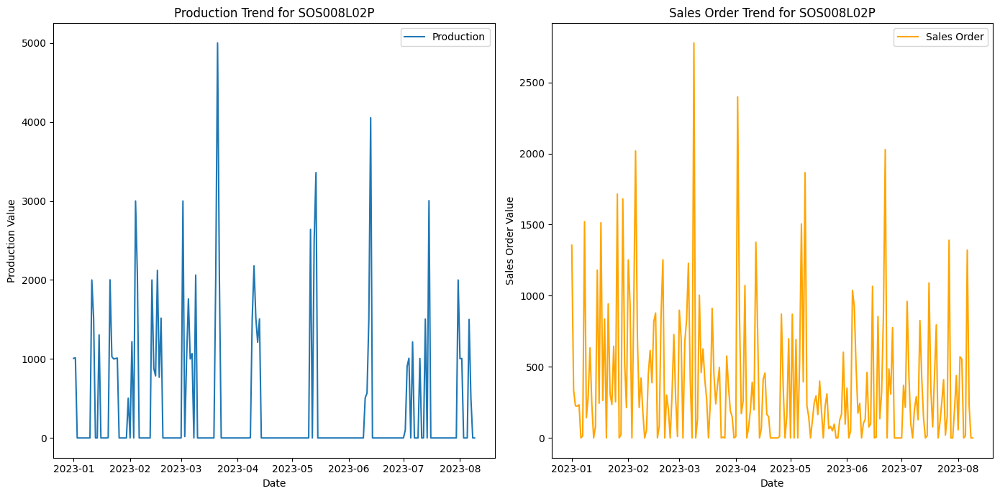

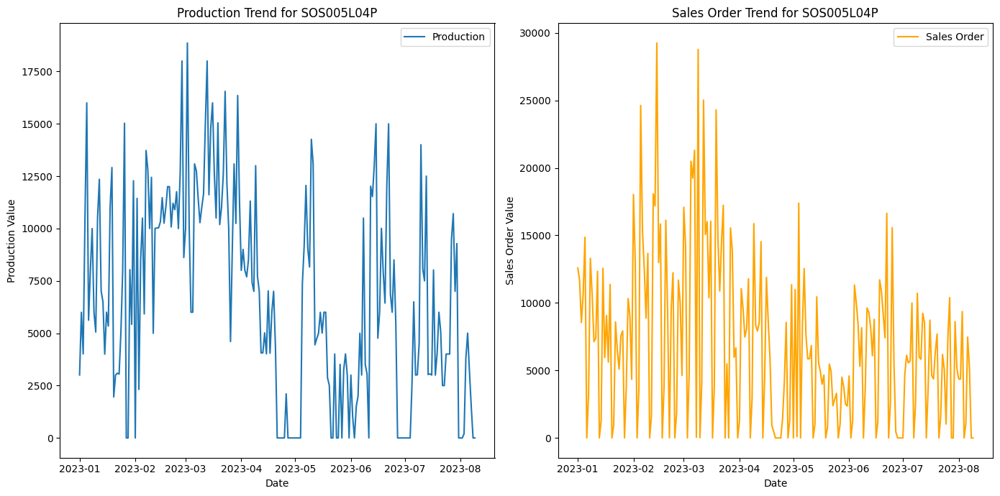

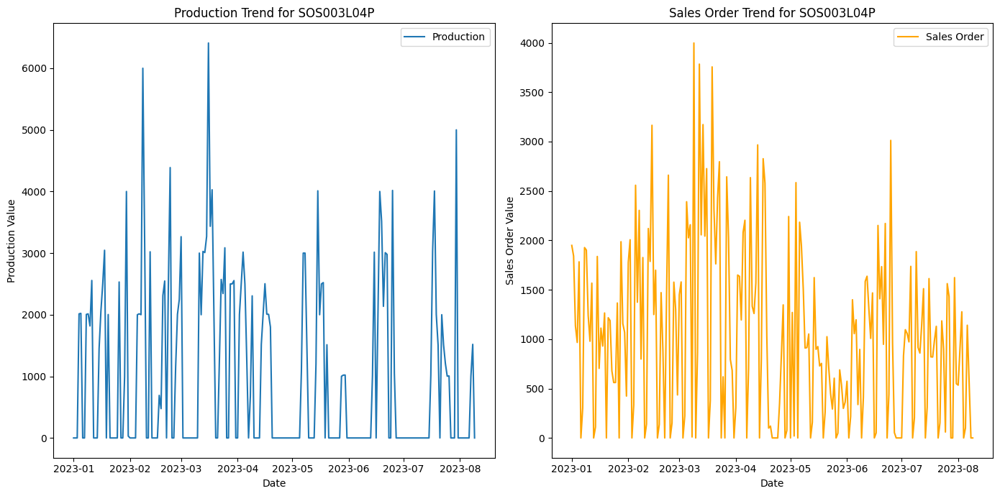

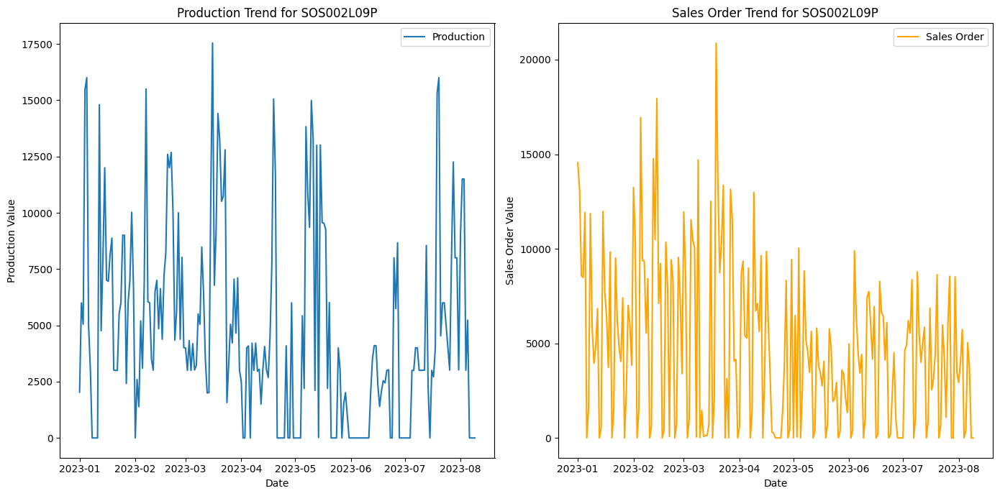

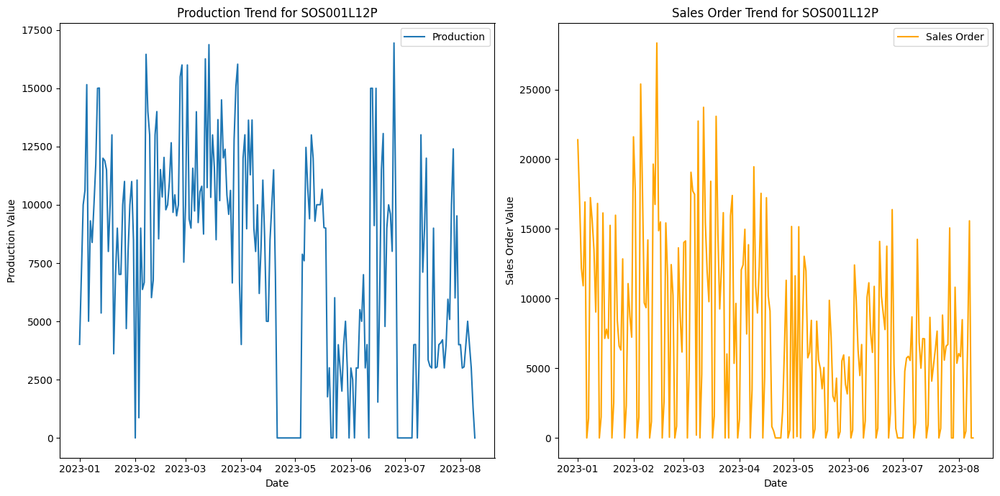

...

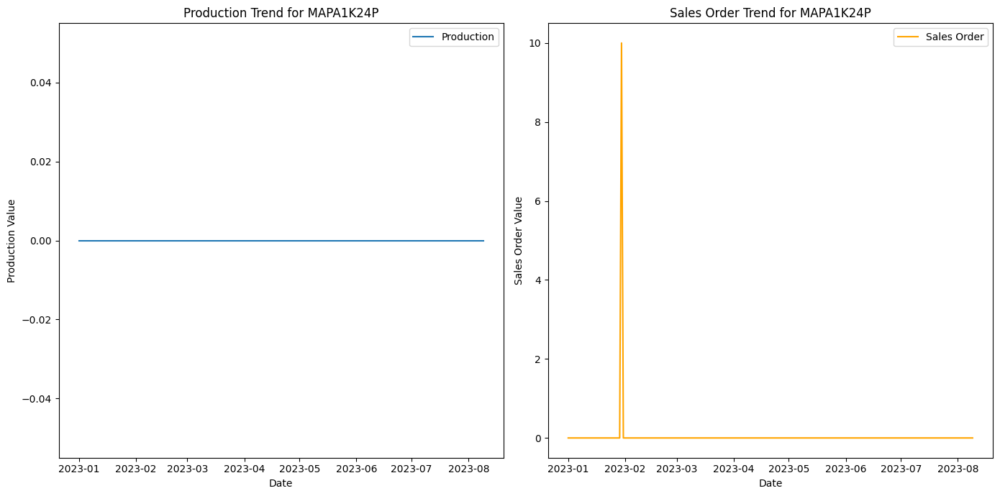

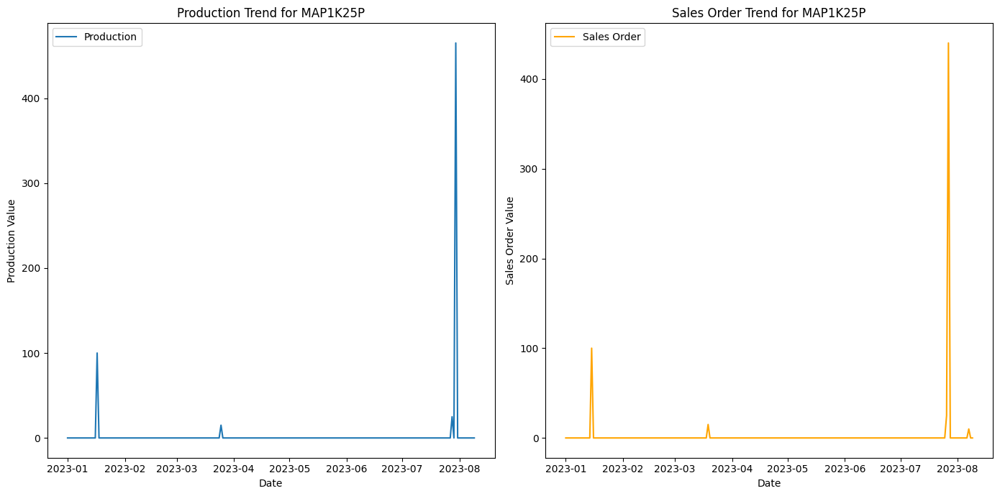

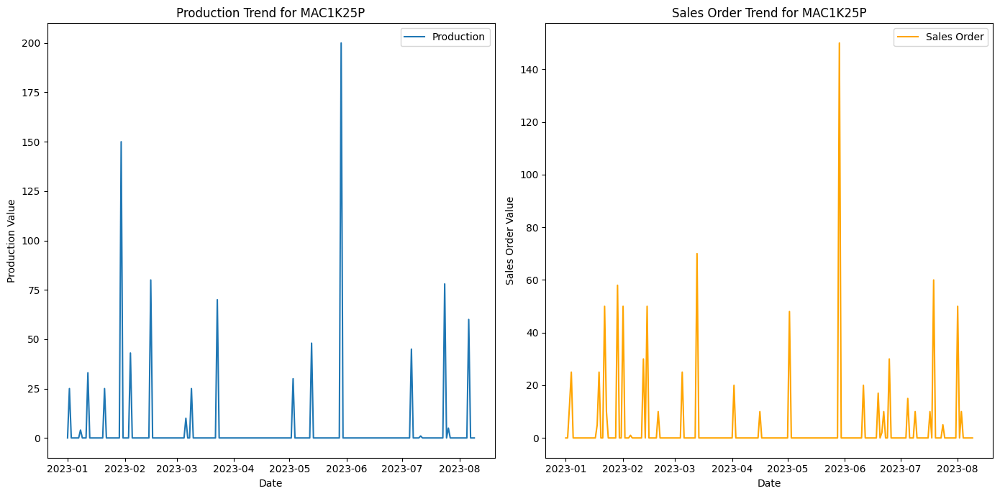

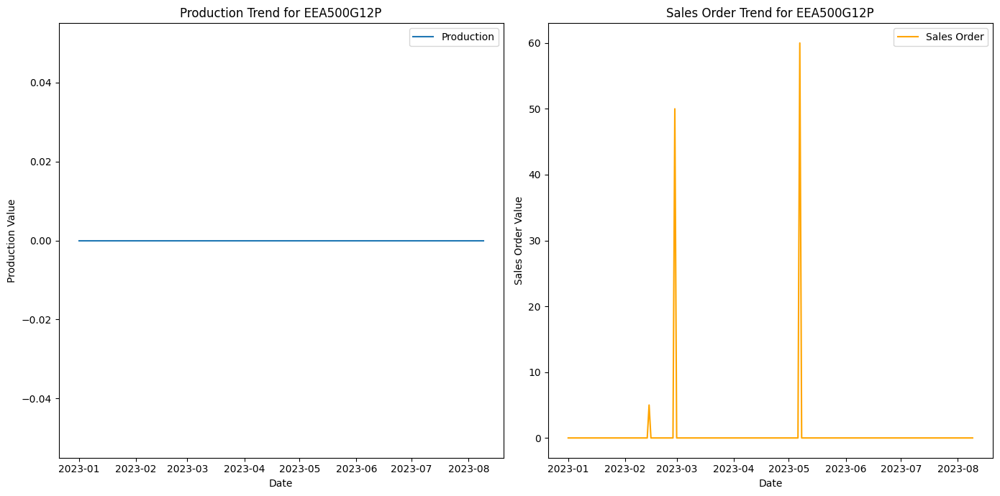

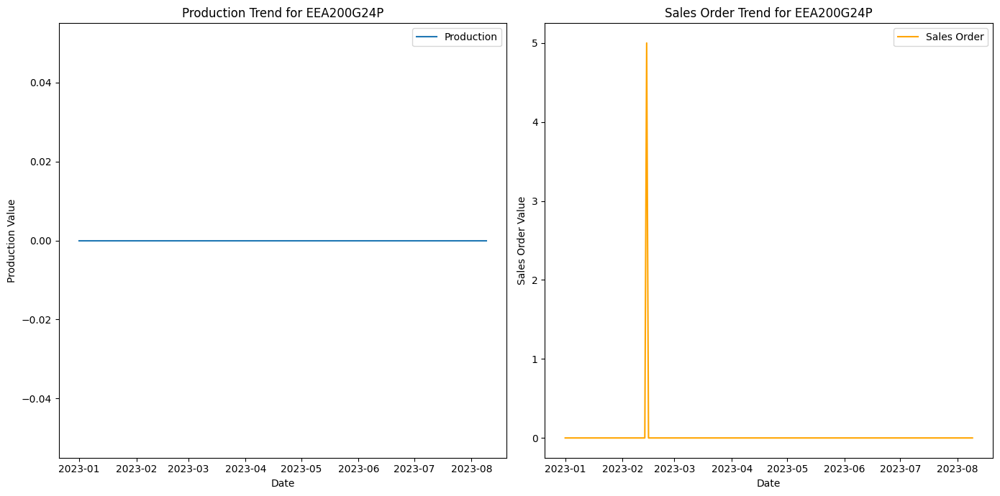

In [13]:
import matplotlib.pyplot as plt

def plot_individual_item_trends(production_data, sales_order_data, date_column):
    """
    Plots individual trends of items over time for production and sales order data.
    
    :param production_data: DataFrame containing production data.
    :param sales_order_data: DataFrame containing sales order data.
    :param date_column: The column name representing the date in both dataframes.
    """
    # Convert date columns to datetime
    production_data[date_column] = pd.to_datetime(production_data[date_column])
    sales_order_data[date_column] = pd.to_datetime(sales_order_data[date_column])
    
    # Extract item columns (all columns except the date column)
    item_columns = [col for col in production_data.columns if col != date_column]
    
    for item in item_columns:
        plt.figure(figsize=(14, 7))
        
        # Plot production trend for the item
        plt.subplot(1, 2, 1)
        plt.plot(production_data[date_column], production_data[item], label='Production')
        plt.title(f'Production Trend for {item}')
        plt.xlabel('Date')
        plt.ylabel('Production Value')
        plt.legend()
        
        # Plot sales order trend for the item
        plt.subplot(1, 2, 2)
        plt.plot(sales_order_data[date_column], sales_order_data[item], label='Sales Order', color='orange')
        plt.title(f'Sales Order Trend for {item}')
        plt.xlabel('Date')
        plt.ylabel('Sales Order Value')
        plt.legend()
        
        plt.tight_layout()
        plt.show()

# Plot the individual trends
plot_individual_item_trends(production_data, sales_order_data, 'Date')


In [5]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd

def cluster_items(production_data, sales_order_data, date_column, n_clusters=3):
    """
    Clusters items into groups based on their production and sales order trends.
    
    :param production_data: DataFrame containing production data.
    :param sales_order_data: DataFrame containing sales order data.
    :param date_column: The column name representing the date in both dataframes.
    :param n_clusters: The number of clusters to form.
    :return: DataFrame with item names and their respective cluster labels.
    """
    # Convert date columns to datetime
    production_data[date_column] = pd.to_datetime(production_data[date_column])
    sales_order_data[date_column] = pd.to_datetime(sales_order_data[date_column])
    
    # Extract item columns (all columns except the date column)
    item_columns = [col for col in production_data.columns if col != date_column]
    
    # Merge production and sales data for each item
    features = []
    for item in item_columns:
        merged_data = pd.merge(production_data[[date_column, item]], 
                               sales_order_data[[date_column, item]], 
                               on=date_column, suffixes=('_production', '_sales'))
        features.append(merged_data.drop(columns=date_column).values.flatten())
    
    # Standardize the features
    features = np.array(features)
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(features_scaled)
    
    # Create a DataFrame with item names and their respective cluster labels
    clusters_df = pd.DataFrame({'Item': item_columns, 'Cluster': labels})
    
    return clusters_df

# Load your data
production_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Weight/Production .csv")
sales_order_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Weight/Sales Order .csv")

# Apply the clustering
clusters_df = cluster_items(production_data, sales_order_data, 'Date')

# Display the clustering results
print(clusters_df)


            Item  Cluster
0     SOS008L02P        0
1     SOS005L04P        2
2     SOS003L04P        0
3     SOS002L09P        1
4     SOS001L12P        1
5     SOS500M24P        0
6     SOS250M48P        0
7     SOP001L12P        0
8     POV005L04P        0
9     POV002L09P        0
10    POV001L24P        0
11    POV500M24P        0
12    POP001L12P        0
13       POP015K        0
14    SO0005L04P        0
15    SO0002L09P        0
16    SO0001L12P        0
17    SO0500M24P        0
18    POP005L04P        0
19    POP002L09P        0
20  POP001L12P.1        0
21    POP500M24P        0
22    POPF01L12P        0
23        AT5X5K        0
24     ATN02K12P        0
25     ATN01K24P        1
26     MAR02K12P        0
27     MAR01K24P        0
28  ATWWP002K12P        0
29  ATWWP001K24P        0
30      MASR025K        0
31      MAHS025K        0
32     SE500G24P        0
33     SE200G24P        0
34    ATPPCH5X5K        0
35     ATPA1K24P        0
36     MAPA1K24P        0
37      MAP1

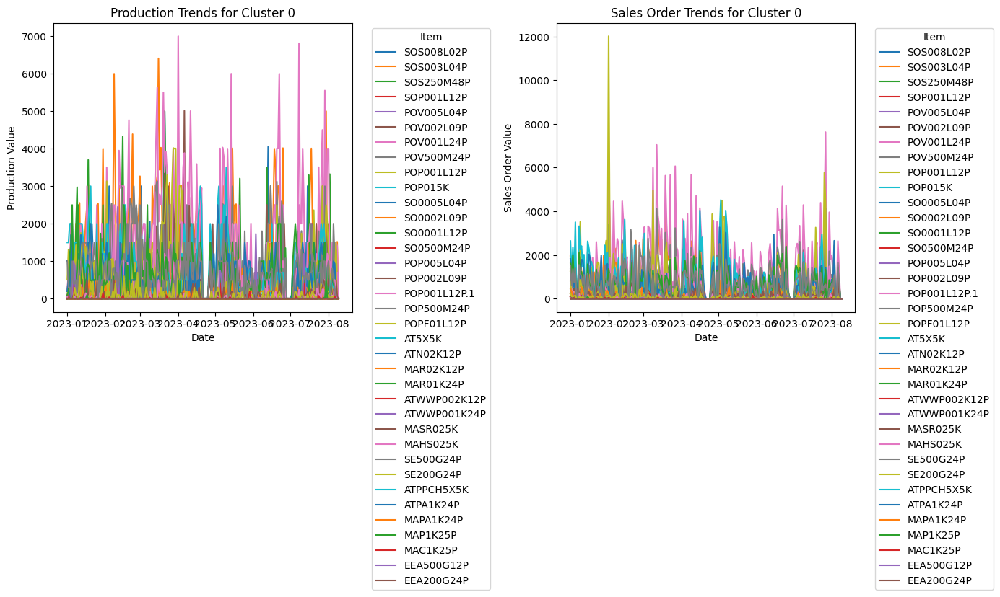

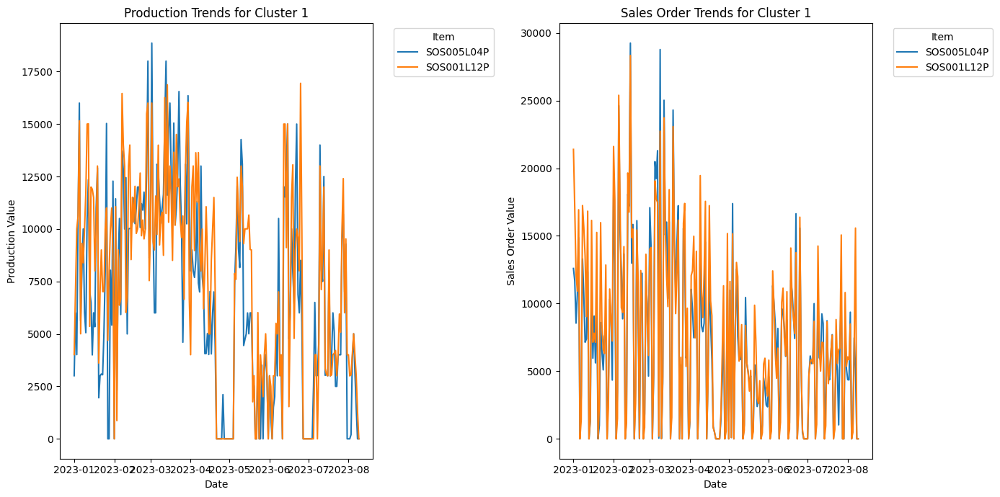

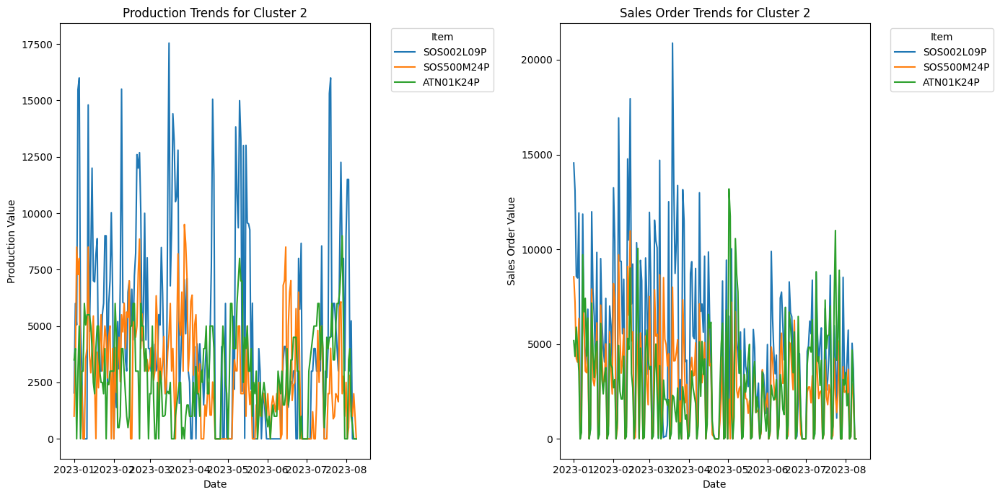

In [14]:
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt

def cluster_items(production_data, sales_order_data, date_column, n_clusters=3):
    """
    Clusters items into groups based on their production and sales order trends.
    
    :param production_data: DataFrame containing production data.
    :param sales_order_data: DataFrame containing sales order data.
    :param date_column: The column name representing the date in both dataframes.
    :param n_clusters: The number of clusters to form.
    :return: DataFrame with item names and their respective cluster labels.
    """
    # Convert date columns to datetime
    production_data[date_column] = pd.to_datetime(production_data[date_column])
    sales_order_data[date_column] = pd.to_datetime(sales_order_data[date_column])
    
    # Extract item columns (all columns except the date column)
    item_columns = [col for col in production_data.columns if col != date_column]
    
    # Merge production and sales data for each item
    features = []
    for item in item_columns:
        merged_data = pd.merge(production_data[[date_column, item]], 
                               sales_order_data[[date_column, item]], 
                               on=date_column, suffixes=('_production', '_sales'))
        features.append(merged_data.drop(columns=date_column).values.flatten())
    
    # Standardize the features
    features = np.array(features)
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(features_scaled)
    
    # Create a DataFrame with item names and their respective cluster labels
    clusters_df = pd.DataFrame({'Item': item_columns, 'Cluster': labels})
    
    return clusters_df

def plot_clusters(production_data, sales_order_data, clusters_df, date_column):
    """
    Plots the trends of items for each cluster.
    
    :param production_data: DataFrame containing production data.
    :param sales_order_data: DataFrame containing sales order data.
    :param clusters_df: DataFrame containing items and their cluster labels.
    :param date_column: The column name representing the date in both dataframes.
    """
    # Convert date columns to datetime
    production_data[date_column] = pd.to_datetime(production_data[date_column])
    sales_order_data[date_column] = pd.to_datetime(sales_order_data[date_column])
    
    # Plot trends for each cluster
    for cluster in clusters_df['Cluster'].unique():
        plt.figure(figsize=(14, 7))
        cluster_items = clusters_df[clusters_df['Cluster'] == cluster]['Item']
        
        # Plot production trends
        plt.subplot(1, 2, 1)
        for item in cluster_items:
            plt.plot(production_data[date_column], production_data[item], label=item)
        plt.title(f'Production Trends for Cluster {cluster}')
        plt.xlabel('Date')
        plt.ylabel('Production Value')
        plt.legend(title='Item', bbox_to_anchor=(1.05, 1), loc='upper left')
        
        # Plot sales order trends
        plt.subplot(1, 2, 2)
        for item in cluster_items:
            plt.plot(sales_order_data[date_column], sales_order_data[item], label=item)
        plt.title(f'Sales Order Trends for Cluster {cluster}')
        plt.xlabel('Date')
        plt.ylabel('Sales Order Value')
        plt.legend(title='Item', bbox_to_anchor=(1.05, 1), loc='upper left')
        
        plt.tight_layout()
        plt.show()

# Load your data
production_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Unit/Production .csv")
sales_order_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Unit/Sales Order.csv")

# Apply the clustering
clusters_df = cluster_items(production_data, sales_order_data, 'Date')

# Plot the cluster trends
plot_clusters(production_data, sales_order_data, clusters_df, 'Date')


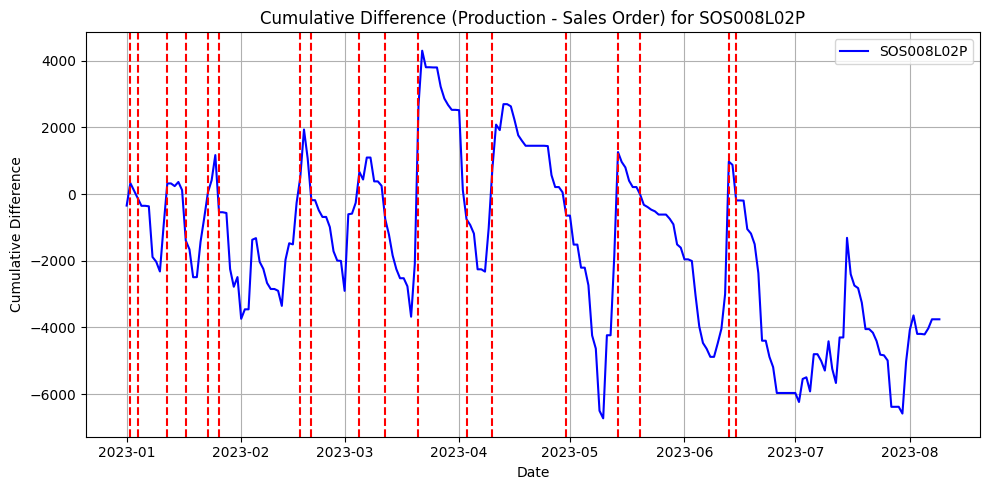

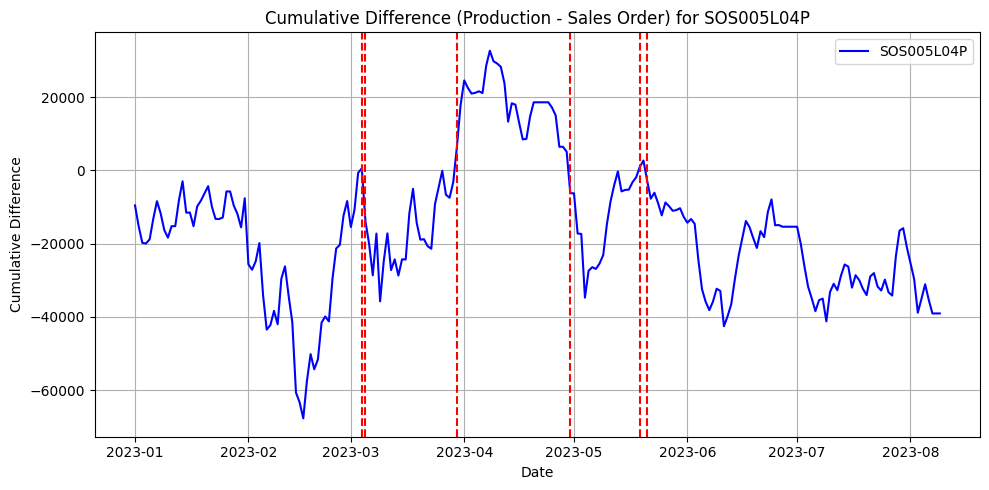

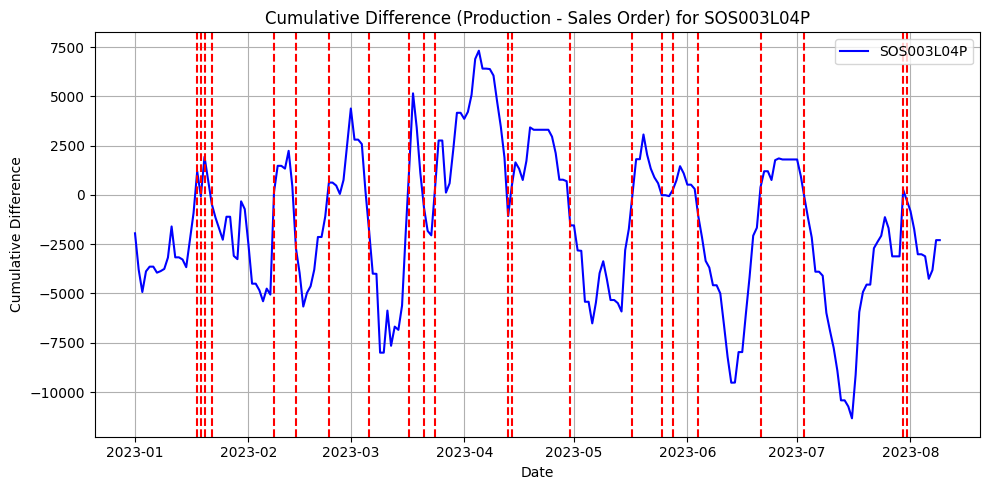

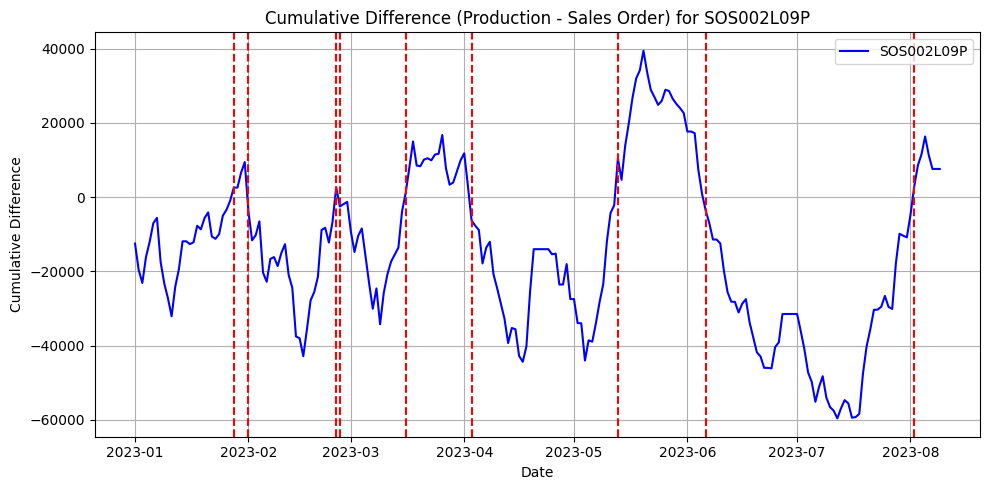

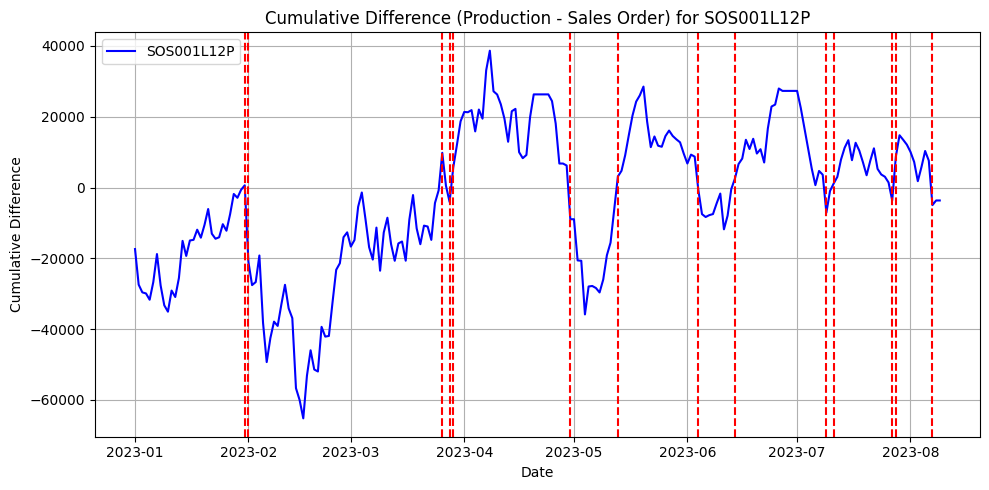

...

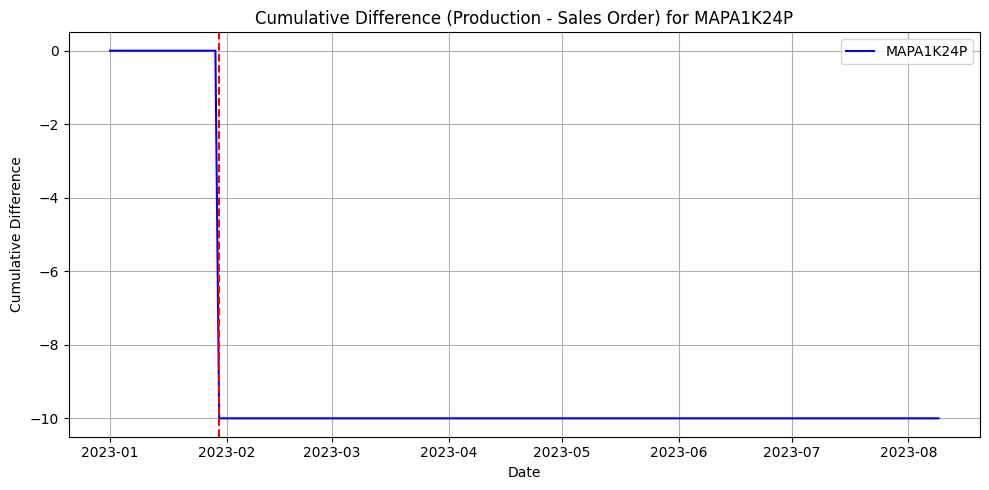

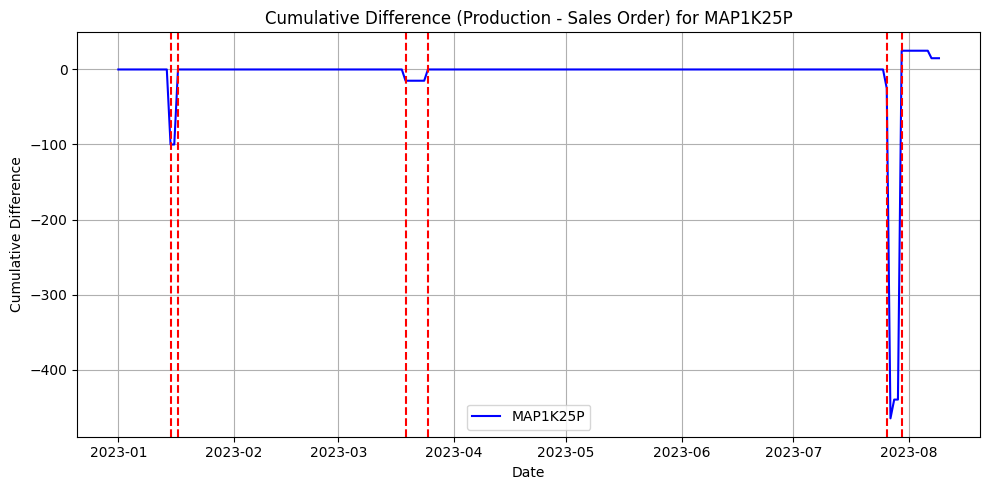

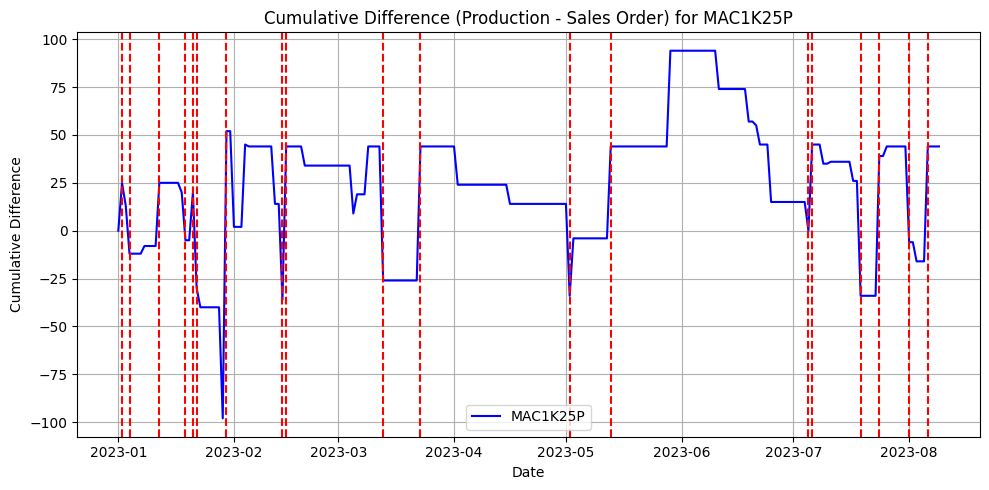

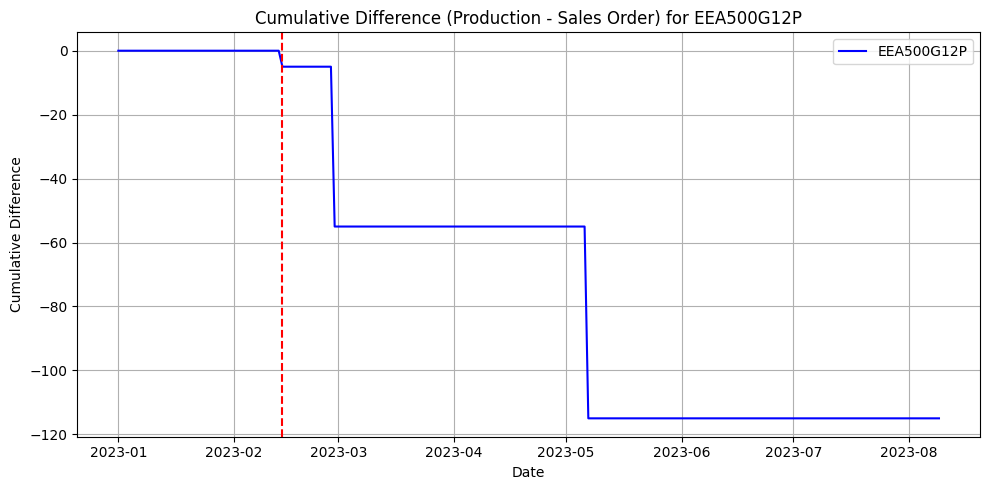

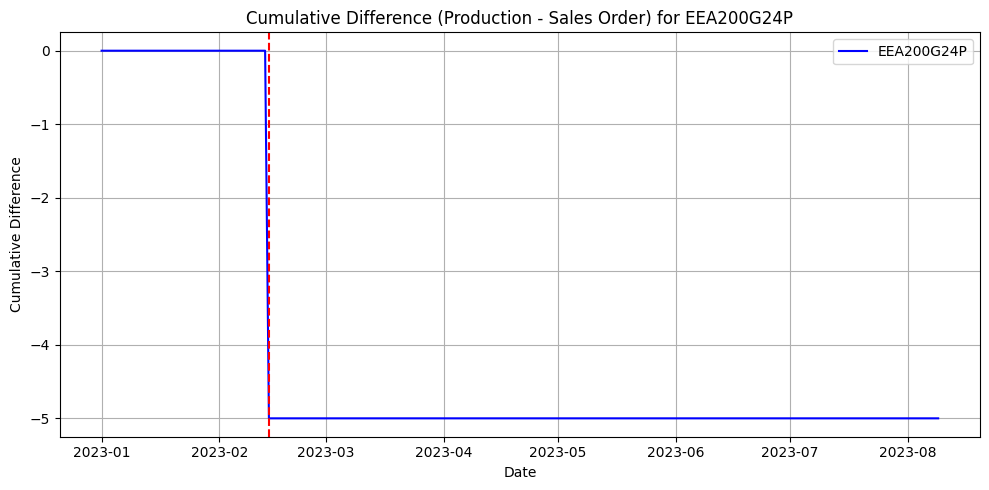

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def plot_cumulative_difference(production_data, sales_order_data, date_column):
    """
    Plots the cumulative sum of the difference between production data and sales order data for each item,
    highlighting the points where the cumulative difference changes sign.
    
    :param production_data: DataFrame containing production data.
    :param sales_order_data: DataFrame containing sales order data.
    :param date_column: The column name representing the date in both dataframes.
    """
    # Convert date columns to datetime
    production_data[date_column] = pd.to_datetime(production_data[date_column])
    sales_order_data[date_column] = pd.to_datetime(sales_order_data[date_column])
    
    # Extract item columns (all columns except the date column)
    item_columns = [col for col in production_data.columns if col != date_column]
    
    for item in item_columns:
        # Calculate the difference and its cumulative sum
        difference = production_data[item] - sales_order_data[item]
        cumulative_difference = difference.cumsum()
        
        # Find points where the cumulative difference changes sign
        sign_change_indices = np.where(np.diff(np.sign(cumulative_difference)))[0]
        
        # Plot the cumulative difference
        plt.figure(figsize=(10, 5))
        plt.plot(production_data[date_column], cumulative_difference, label=item, color='blue')
        
        # Highlight points where the sign changes
        for idx in sign_change_indices:
            plt.axvline(production_data[date_column].iloc[idx+1], color='red', linestyle='--')
        
        plt.title(f'Cumulative Difference (Production - Sales Order) for {item}')
        plt.xlabel('Date')
        plt.ylabel('Cumulative Difference')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Load your data
production_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Unit/Production .csv")
sales_order_data = pd.read_csv("Raw Dataset/Homogenoeus/Temporal Data/Unit/Sales Order.csv")

# Plot the cumulative difference
plot_cumulative_difference(production_data, sales_order_data, 'Date')
